In [1]:
import warnings
warnings.filterwarnings('ignore')
import dynamo as dyn
import pandas as pd
import numpy as np
import anndata

In [2]:
dyn.get_all_dependencies_version()

package,cvxopt,anndata,loompy,trimap,numdifftools,hdbscan,statsmodels,numba,seaborn,colorcet,tqdm,python-igraph,pynndescent,dynamo-release,matplotlib,numpy,pandas,scikit-learn,scipy,setuptools,umap-learn
version,1.2.5.post1,0.7.5,3.0.6,1.4.3.dev1,0.9.39,0.8.26,0.12.1,0.52.0,0.11.1,2.0.2,4.56.0,0.8.3,0.5.1,0.95.2,3.3.3,1.19.3,1.2.0,0.24.0,1.6.0,49.2.1,0.4.6


In [3]:
dyn.configuration.set_figure_params('dynamo', background='white')

In [4]:
X = pd.read_csv('data/export-hs4-pivot.csv')

In [5]:
#X_new => 2019
X_new = X.loc[X['year_at'] == 2019]
X_new = X_new.drop(['year_at'], axis=1)
X_new = X_new.set_index(['exporter'])
X_new

0101   0102  0103  0104    0105    0106   0201  \
exporter                                                                    
Afghanistan                 0.0    0.0   0.0  35.0     0.0     3.0    0.0   
Albania                     0.0    0.0   0.0  31.0     0.0   815.0  278.0   
Algeria                     0.0    0.0   0.0   0.0     0.0    14.0    0.0   
American Samoa              0.0    0.0   0.0   0.0     0.0     0.0    0.0   
Andorra                    48.0  123.0   0.0  15.0     0.0     8.0    0.0   
...                         ...    ...   ...   ...     ...     ...    ...   
Wallis and Futuna Islands   0.0    0.0   0.0   0.0     0.0     0.0    0.0   
Western Sahara              0.0    0.0   0.0   0.0     0.0     0.0    0.0   
Yemen                       0.0    0.0   0.0   0.0     0.0     0.0    0.0   
Zambia                     18.0   30.0   8.0   1.0  7349.0   142.0  157.0   
Zimbabwe                   24.0   64.0   0.0   0.0  1722.0  1240.0    0.0   

                            0202   0203   0204   0205   0206     0207    0208  \
exporter                                                                        
Afghanistan                  0.0    0.0    0.0    0.0    0.0      0.0     0.0   
Albania                      0.0    0.0    0.0  281.0    0.0      6.0  1117.0   
Algeria                     91.0    0.0    0.0    0.0    0.0   1379.0     0.0   
American Samoa               3.0   18.0    0.0    0.0    0.0    385.0     4.0   
Andorra                      1.0    0.0    0.0    0.0   16.0     22.0     0.0   
...                          ...    ...    ...    ...    ...      ...     ...   
Wallis and Futuna Islands    0.0    0.0    0.0    0.0    0.0      0.0     0.0   
Western Sahara               0.0    0.0    0.0    0.0    0.0      0.0     0.0   
Yemen                        0.0    0.0    0.0    0.0    0.0      0.0     0.0   
Zambia                     175.0  152.0    1.0    0.0  771.0  13112.0    94.0   
Zimbabwe                     0.0  211.0  203.0    0.0  775.0      0.0   720.0   

                           0209  0210    0301     0302     0303    0304  \
exporter                                                                  
Afghanistan                 0.0   0.0     0.0      0.0      0.0     0.0   
Albania                     0.0   0.0  1775.0   8676.0   2416.0   969.0   
Algeria                     0.0   0.0  6575.0    940.0    902.0  4866.0   
American Samoa              7.0   1.0     0.0      2.0      1.0     1.0   
Andorra                     0.0   0.0     0.0      0.0      1.0     0.0   
...                         ...   ...     ...      ...      ...     ...   
Wallis and Futuna Islands   0.0   0.0     0.0      0.0      0.0     0.0   
Western Sahara              0.0   0.0     0.0      0.0     61.0     0.0   
Yemen                       0.0   0.0    40.0  59011.0  36728.0  1746.0   
Zambia                      0.0   5.0     4.0     55.0   3383.0    67.0   
Zimbabwe                    0.0   0.0   293.0      0.0   5865.0   371.0   

                              0305    0306     0307     0308    0401    0402  \
exporter                                                                       
Afghanistan                    0.0     0.0      0.0      0.0     0.0     0.0   
Albania                    20131.0  3648.0   7669.0     43.0     0.0     0.0   
Algeria                       15.0  2266.0  14609.0     19.0    10.0  4137.0   
American Samoa                 0.0     0.0      0.0      0.0     0.0     5.0   
Andorra                        0.0     0.0      0.0      0.0     1.0     0.0   
...                            ...     ...      ...      ...     ...     ...   
Wallis and Futuna Islands      0.0     0.0      0.0      0.0     0.0     0.0   
Western Sahara                 0.0     0.0      0.0      0.0     0.0     0.0   
Yemen                       4102.0  6953.0  25266.0  10842.0  1035.0  3112.0   
Zambia                       385.0     0.0      0.0      1.0   114.0  1702.0   
Zimbabwe                       1.0 

In [6]:
#X_old => 2013
X_old = X.loc[X['year_at'] == 2019]
X_old = X_old.drop(['year_at'], axis=1)
X_old = X_old.set_index(['exporter'])
X_old

0101   0102  0103  0104    0105    0106   0201  \
exporter                                                                    
Afghanistan                 0.0    0.0   0.0  35.0     0.0     3.0    0.0   
Albania                     0.0    0.0   0.0  31.0     0.0   815.0  278.0   
Algeria                     0.0    0.0   0.0   0.0     0.0    14.0    0.0   
American Samoa              0.0    0.0   0.0   0.0     0.0     0.0    0.0   
Andorra                    48.0  123.0   0.0  15.0     0.0     8.0    0.0   
...                         ...    ...   ...   ...     ...     ...    ...   
Wallis and Futuna Islands   0.0    0.0   0.0   0.0     0.0     0.0    0.0   
Western Sahara              0.0    0.0   0.0   0.0     0.0     0.0    0.0   
Yemen                       0.0    0.0   0.0   0.0     0.0     0.0    0.0   
Zambia                     18.0   30.0   8.0   1.0  7349.0   142.0  157.0   
Zimbabwe                   24.0   64.0   0.0   0.0  1722.0  1240.0    0.0   

                            0202   0203   0204   0205   0206     0207    0208  \
exporter                                                                        
Afghanistan                  0.0    0.0    0.0    0.0    0.0      0.0     0.0   
Albania                      0.0    0.0    0.0  281.0    0.0      6.0  1117.0   
Algeria                     91.0    0.0    0.0    0.0    0.0   1379.0     0.0   
American Samoa               3.0   18.0    0.0    0.0    0.0    385.0     4.0   
Andorra                      1.0    0.0    0.0    0.0   16.0     22.0     0.0   
...                          ...    ...    ...    ...    ...      ...     ...   
Wallis and Futuna Islands    0.0    0.0    0.0    0.0    0.0      0.0     0.0   
Western Sahara               0.0    0.0    0.0    0.0    0.0      0.0     0.0   
Yemen                        0.0    0.0    0.0    0.0    0.0      0.0     0.0   
Zambia                     175.0  152.0    1.0    0.0  771.0  13112.0    94.0   
Zimbabwe                     0.0  211.0  203.0    0.0  775.0      0.0   720.0   

                           0209  0210    0301     0302     0303    0304  \
exporter                                                                  
Afghanistan                 0.0   0.0     0.0      0.0      0.0     0.0   
Albania                     0.0   0.0  1775.0   8676.0   2416.0   969.0   
Algeria                     0.0   0.0  6575.0    940.0    902.0  4866.0   
American Samoa              7.0   1.0     0.0      2.0      1.0     1.0   
Andorra                     0.0   0.0     0.0      0.0      1.0     0.0   
...                         ...   ...     ...      ...      ...     ...   
Wallis and Futuna Islands   0.0   0.0     0.0      0.0      0.0     0.0   
Western Sahara              0.0   0.0     0.0      0.0     61.0     0.0   
Yemen                       0.0   0.0    40.0  59011.0  36728.0  1746.0   
Zambia                      0.0   5.0     4.0     55.0   3383.0    67.0   
Zimbabwe                    0.0   0.0   293.0      0.0   5865.0   371.0   

                              0305    0306     0307     0308    0401    0402  \
exporter                                                                       
Afghanistan                    0.0     0.0      0.0      0.0     0.0     0.0   
Albania                    20131.0  3648.0   7669.0     43.0     0.0     0.0   
Algeria                       15.0  2266.0  14609.0     19.0    10.0  4137.0   
American Samoa                 0.0     0.0      0.0      0.0     0.0     5.0   
Andorra                        0.0     0.0      0.0      0.0     1.0     0.0   
...                            ...     ...      ...      ...     ...     ...   
Wallis and Futuna Islands      0.0     0.0      0.0      0.0     0.0     0.0   
Western Sahara                 0.0     0.0      0.0      0.0     0.0     0.0   
Yemen                       4102.0  6953.0  25266.0  10842.0  1035.0  3112.0   
Zambia                       385.0     0.0      0.0      1.0   114.0  1702.0   
Zimbabwe                       1.0 

In [7]:
obs = pd.read_csv('countries.csv')
obs = obs.set_index('name')
obs

,id,created_at,updated_at,code,iso_code,iso_name,parentCode,parentName
name,,,,,,,,
Afghanistan,1,2021-01-06 05:28:44,2021-01-06 05:28:44,4,AF,Afghanistan,13,South Asia
Albania,2,2021-01-06 05:28:45,2021-01-06 05:28:45,8,AL,Albania,6,East Europe & Central Asia
Algeria,3,2021-01-06 05:28:45,2021-01-06 05:28:45,12,DZ,Algeria,11,Northern Africa
American Samoa,4,2021-01-06 05:28:45,2021-01-06 05:28:45,16,AS,American Samoa,12,Pacific
Andorra,5,2021-01-06 05:28:45,2021-01-06 05:28:45,20,AD,Andorra,4,EU & West Europe
...,...,...,...,...,...,...,...,...
Wallis and Futuna Islands,218,2021-01-06 05:29:04,2021-01-06 05:29:04,876,WF,Wallis and Futuna,12,Pacific
Western Sahara,219,2021-01-06 05:29:04,2021-01-06 05:29:04,732,EH,Western Sahara,11,Northern Africa
Yemen,220,2021-01-06 05:29:05,2021-01-06 05:29:05,887,YE,Yemen,9,Middle East


In [8]:
intersect_obs = list(set(list(X_new.index)) & set(list(X_old.index)) & set(list(obs.index)))
intersect_obs.sort()
intersect_obs

['Afghanistan',
 'Albania',
 'Algeria',
 'American Samoa',
 'Andorra',
 'Angola',
 'Anguilla',
 'Antigua and Barbuda',
 'Argentina',
 'Armenia',
 'Aruba',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahamas',
 'Bahrain',
 'Bangladesh',
 'Barbados',
 'Belarus',
 'Belgium',
 'Belize',
 'Benin',
 'Bermuda',
 'Bhutan',
 'Bolivia, Plurinational State of',
 'Bosnia and Herzegovina',
 'Botswana',
 'Brazil',
 'British Indian Ocean Territory',
 'British Virgin Islands',
 'Brunei Darussalam',
 'Bulgaria',
 'Burkina Faso',
 'Burundi',
 'Cabo Verde',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Cayman Islands',
 'Central African Republic',
 'Chad',
 'Chile',
 'China',
 'Christmas Island',
 'Cocos (Keeling) Islands',
 'Colombia',
 'Comoros',
 'Congo',
 'Congo, Democratic Republic of the',
 'Cook Islands',
 'Costa Rica',
 'Croatia',
 'Cuba',
 'Curaçao',
 'Cyprus',
 "Côte d'Ivoire",
 'Denmark',
 'Djibouti',
 'Dominica',
 'Dominican Republic',
 'Ecuador',
 'Egypt',
 'El Salvador',
 'Equatorial Guinea',
 'Eri

In [9]:
filtered_X_new = X_new.loc[intersect_obs]
filtered_X_new

0101   0102  0103  0104    0105    0106   0201  \
exporter                                                                    
Afghanistan                 0.0    0.0   0.0  35.0     0.0     3.0    0.0   
Albania                     0.0    0.0   0.0  31.0     0.0   815.0  278.0   
Algeria                     0.0    0.0   0.0   0.0     0.0    14.0    0.0   
American Samoa              0.0    0.0   0.0   0.0     0.0     0.0    0.0   
Andorra                    48.0  123.0   0.0  15.0     0.0     8.0    0.0   
...                         ...    ...   ...   ...     ...     ...    ...   
Wallis and Futuna Islands   0.0    0.0   0.0   0.0     0.0     0.0    0.0   
Western Sahara              0.0    0.0   0.0   0.0     0.0     0.0    0.0   
Yemen                       0.0    0.0   0.0   0.0     0.0     0.0    0.0   
Zambia                     18.0   30.0   8.0   1.0  7349.0   142.0  157.0   
Zimbabwe                   24.0   64.0   0.0   0.0  1722.0  1240.0    0.0   

                            0202   0203   0204   0205   0206     0207    0208  \
exporter                                                                        
Afghanistan                  0.0    0.0    0.0    0.0    0.0      0.0     0.0   
Albania                      0.0    0.0    0.0  281.0    0.0      6.0  1117.0   
Algeria                     91.0    0.0    0.0    0.0    0.0   1379.0     0.0   
American Samoa               3.0   18.0    0.0    0.0    0.0    385.0     4.0   
Andorra                      1.0    0.0    0.0    0.0   16.0     22.0     0.0   
...                          ...    ...    ...    ...    ...      ...     ...   
Wallis and Futuna Islands    0.0    0.0    0.0    0.0    0.0      0.0     0.0   
Western Sahara               0.0    0.0    0.0    0.0    0.0      0.0     0.0   
Yemen                        0.0    0.0    0.0    0.0    0.0      0.0     0.0   
Zambia                     175.0  152.0    1.0    0.0  771.0  13112.0    94.0   
Zimbabwe                     0.0  211.0  203.0    0.0  775.0      0.0   720.0   

                           0209  0210    0301     0302     0303    0304  \
exporter                                                                  
Afghanistan                 0.0   0.0     0.0      0.0      0.0     0.0   
Albania                     0.0   0.0  1775.0   8676.0   2416.0   969.0   
Algeria                     0.0   0.0  6575.0    940.0    902.0  4866.0   
American Samoa              7.0   1.0     0.0      2.0      1.0     1.0   
Andorra                     0.0   0.0     0.0      0.0      1.0     0.0   
...                         ...   ...     ...      ...      ...     ...   
Wallis and Futuna Islands   0.0   0.0     0.0      0.0      0.0     0.0   
Western Sahara              0.0   0.0     0.0      0.0     61.0     0.0   
Yemen                       0.0   0.0    40.0  59011.0  36728.0  1746.0   
Zambia                      0.0   5.0     4.0     55.0   3383.0    67.0   
Zimbabwe                    0.0   0.0   293.0      0.0   5865.0   371.0   

                              0305    0306     0307     0308    0401    0402  \
exporter                                                                       
Afghanistan                    0.0     0.0      0.0      0.0     0.0     0.0   
Albania                    20131.0  3648.0   7669.0     43.0     0.0     0.0   
Algeria                       15.0  2266.0  14609.0     19.0    10.0  4137.0   
American Samoa                 0.0     0.0      0.0      0.0     0.0     5.0   
Andorra                        0.0     0.0      0.0      0.0     1.0     0.0   
...                            ...     ...      ...      ...     ...     ...   
Wallis and Futuna Islands      0.0     0.0      0.0      0.0     0.0     0.0   
Western Sahara                 0.0     0.0      0.0      0.0     0.0     0.0   
Yemen                       4102.0  6953.0  25266.0  10842.0  1035.0  3112.0   
Zambia                       385.0     0.0      0.0      1.0   114.0  1702.0   
Zimbabwe                       1.0 

In [10]:
filtered_X_old = X_old.loc[intersect_obs]
filtered_X_old

0101   0102  0103  0104    0105    0106   0201  \
exporter                                                                    
Afghanistan                 0.0    0.0   0.0  35.0     0.0     3.0    0.0   
Albania                     0.0    0.0   0.0  31.0     0.0   815.0  278.0   
Algeria                     0.0    0.0   0.0   0.0     0.0    14.0    0.0   
American Samoa              0.0    0.0   0.0   0.0     0.0     0.0    0.0   
Andorra                    48.0  123.0   0.0  15.0     0.0     8.0    0.0   
...                         ...    ...   ...   ...     ...     ...    ...   
Wallis and Futuna Islands   0.0    0.0   0.0   0.0     0.0     0.0    0.0   
Western Sahara              0.0    0.0   0.0   0.0     0.0     0.0    0.0   
Yemen                       0.0    0.0   0.0   0.0     0.0     0.0    0.0   
Zambia                     18.0   30.0   8.0   1.0  7349.0   142.0  157.0   
Zimbabwe                   24.0   64.0   0.0   0.0  1722.0  1240.0    0.0   

                            0202   0203   0204   0205   0206     0207    0208  \
exporter                                                                        
Afghanistan                  0.0    0.0    0.0    0.0    0.0      0.0     0.0   
Albania                      0.0    0.0    0.0  281.0    0.0      6.0  1117.0   
Algeria                     91.0    0.0    0.0    0.0    0.0   1379.0     0.0   
American Samoa               3.0   18.0    0.0    0.0    0.0    385.0     4.0   
Andorra                      1.0    0.0    0.0    0.0   16.0     22.0     0.0   
...                          ...    ...    ...    ...    ...      ...     ...   
Wallis and Futuna Islands    0.0    0.0    0.0    0.0    0.0      0.0     0.0   
Western Sahara               0.0    0.0    0.0    0.0    0.0      0.0     0.0   
Yemen                        0.0    0.0    0.0    0.0    0.0      0.0     0.0   
Zambia                     175.0  152.0    1.0    0.0  771.0  13112.0    94.0   
Zimbabwe                     0.0  211.0  203.0    0.0  775.0      0.0   720.0   

                           0209  0210    0301     0302     0303    0304  \
exporter                                                                  
Afghanistan                 0.0   0.0     0.0      0.0      0.0     0.0   
Albania                     0.0   0.0  1775.0   8676.0   2416.0   969.0   
Algeria                     0.0   0.0  6575.0    940.0    902.0  4866.0   
American Samoa              7.0   1.0     0.0      2.0      1.0     1.0   
Andorra                     0.0   0.0     0.0      0.0      1.0     0.0   
...                         ...   ...     ...      ...      ...     ...   
Wallis and Futuna Islands   0.0   0.0     0.0      0.0      0.0     0.0   
Western Sahara              0.0   0.0     0.0      0.0     61.0     0.0   
Yemen                       0.0   0.0    40.0  59011.0  36728.0  1746.0   
Zambia                      0.0   5.0     4.0     55.0   3383.0    67.0   
Zimbabwe                    0.0   0.0   293.0      0.0   5865.0   371.0   

                              0305    0306     0307     0308    0401    0402  \
exporter                                                                       
Afghanistan                    0.0     0.0      0.0      0.0     0.0     0.0   
Albania                    20131.0  3648.0   7669.0     43.0     0.0     0.0   
Algeria                       15.0  2266.0  14609.0     19.0    10.0  4137.0   
American Samoa                 0.0     0.0      0.0      0.0     0.0     5.0   
Andorra                        0.0     0.0      0.0      0.0     1.0     0.0   
...                            ...     ...      ...      ...     ...     ...   
Wallis and Futuna Islands      0.0     0.0      0.0      0.0     0.0     0.0   
Western Sahara                 0.0     0.0      0.0      0.0     0.0     0.0   
Yemen                       4102.0  6953.0  25266.0  10842.0  1035.0  3112.0   
Zambia                       385.0     0.0      0.0      1.0   114.0  1702.0   
Zimbabwe                       1.0 

In [11]:
filtered_obs = obs.loc[intersect_obs]
filtered_obs

,id,created_at,updated_at,code,iso_code,iso_name,parentCode,parentName
name,,,,,,,,
Afghanistan,1,2021-01-06 05:28:44,2021-01-06 05:28:44,4,AF,Afghanistan,13,South Asia
Albania,2,2021-01-06 05:28:45,2021-01-06 05:28:45,8,AL,Albania,6,East Europe & Central Asia
Algeria,3,2021-01-06 05:28:45,2021-01-06 05:28:45,12,DZ,Algeria,11,Northern Africa
American Samoa,4,2021-01-06 05:28:45,2021-01-06 05:28:45,16,AS,American Samoa,12,Pacific
Andorra,5,2021-01-06 05:28:45,2021-01-06 05:28:45,20,AD,Andorra,4,EU & West Europe
...,...,...,...,...,...,...,...,...
Wallis and Futuna Islands,218,2021-01-06 05:29:04,2021-01-06 05:29:04,876,WF,Wallis and Futuna,12,Pacific
Western Sahara,219,2021-01-06 05:29:04,2021-01-06 05:29:04,732,EH,Western Sahara,11,Northern Africa
Yemen,220,2021-01-06 05:29:05,2021-01-06 05:29:05,887,YE,Yemen,9,Middle East


In [12]:
var = pd.DataFrame(np.array(X.columns)[2:], columns=['hscode'])
var = var.set_index('hscode')
var

""
hscode
0101
0102
0103
0104
0105
...
9703
9704
9705


In [13]:
layers = {
    "spliced" : filtered_X_new.to_numpy(),
    "unspliced" : filtered_X_old.to_numpy(),
}
adata = anndata.AnnData(X=filtered_X_new.to_numpy(), obs=filtered_obs,var=var, layers=layers)
adata

AnnData object with n_obs × n_vars = 219 × 1258
    obs: 'id', 'created_at', 'updated_at', 'code', 'iso_code', 'iso_name', 'parentCode', 'parentName'
    layers: 'spliced', 'unspliced'

In [14]:
dyn.pp.recipe_monocle(adata)

AnnData object with n_obs × n_vars = 219 × 1258
    obs: 'id', 'created_at', 'updated_at', 'code', 'iso_code', 'iso_name', 'parentCode', 'parentName', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'ntr'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'use_for_pca', 'ntr'
    uns: 'pp', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection'
    obsm: 'X_pca', 'X'
    layers: 'spliced', 'unspliced', 'X_unspliced', 'X_spliced'

In [15]:
dyn.tl.dynamics(adata, model='stochastic', cores=8)

AnnData object with n_obs × n_vars = 219 × 1258
    obs: 'id', 'created_at', 'updated_at', 'code', 'iso_code', 'iso_name', 'parentCode', 'parentName', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'ntr'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics'
    uns: 'pp', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics'
    obsm: 'X_pca', 'X'
    layers: 'spliced', 'unspliced', 'X_unspliced', 'X_spliced', 'M_u', 'M_uu', 'M_s', 'M_us', 'M_ss', 'velocity_S'
    obsp: 'moments_con'

In [16]:
adata.layers['X_spliced']

<219x1258 sparse matrix of type '<class 'numpy.float64'>'
	with 137450 stored elements in Compressed Sparse Row format>

<Figure size 600x400 with 0 Axes>

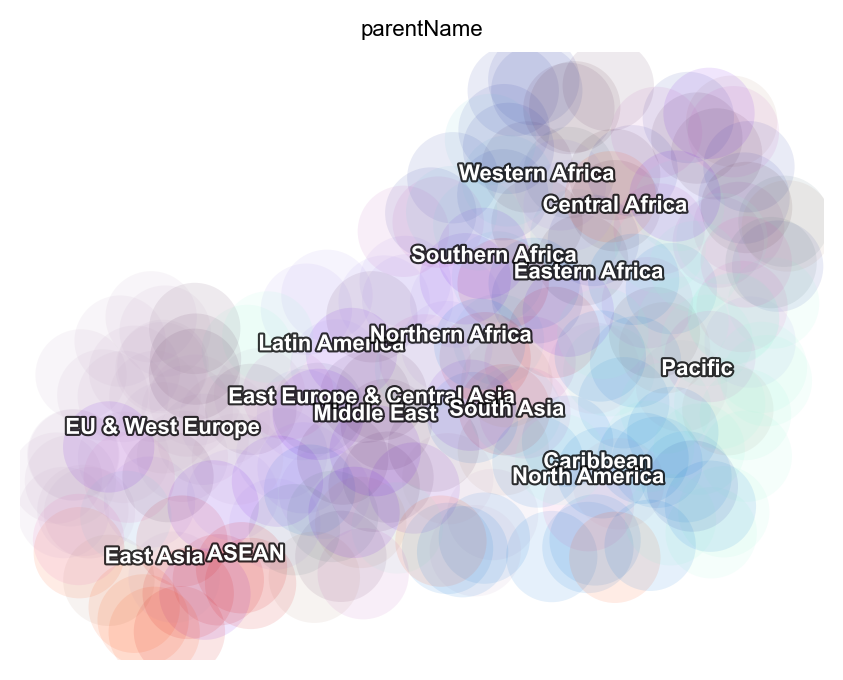

In [17]:
dyn.tl.reduceDimension(adata)

dyn.pl.umap(adata, color='parentName')

<Figure size 600x400 with 0 Axes>

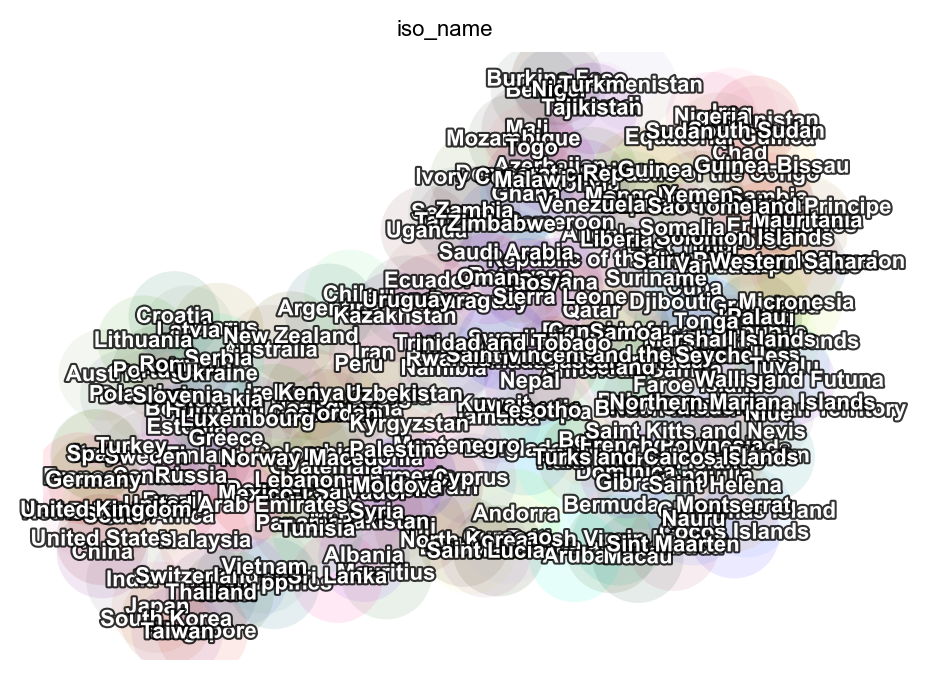

In [18]:
dyn.pl.umap(adata, color='iso_name')

In [19]:
adata

AnnData object with n_obs × n_vars = 219 × 1258
    obs: 'id', 'created_at', 'updated_at', 'code', 'iso_code', 'iso_name', 'parentCode', 'parentName', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'ntr'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics'
    uns: 'pp', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit'
    obsm: 'X_pca', 'X', 'X_umap'
    layers: 'spliced', 'unspliced', 'X_unspliced', 'X_spliced', 'M_u', 'M_uu', 'M_s', 'M_us', 'M_ss', 'velocity_S'
    obsp: 'moments_con', 'connectivities', 'distances'

In [45]:
adata.layers['velocity_S']

<219x1258 sparse matrix of type '<class 'numpy.float64'>'
	with 255632 stored elements in Compressed Sparse Row format>

In [46]:
adata.layers['spliced']

<219x1258 sparse matrix of type '<class 'numpy.float64'>'
	with 137450 stored elements in Compressed Sparse Row format>

In [47]:
adata.layers['unspliced']

<219x1258 sparse matrix of type '<class 'numpy.float64'>'
	with 137450 stored elements in Compressed Sparse Row format>

In [25]:
adata.uns['neighbors']

OverloadedDict, wrapping:
	{'params': {'n_neighbors': 30, 'method': 'umap'}, 'indices': array([[  0,  23,  28, ..., 214, 215, 216],
       [  1, 116, 132, ..., 189, 154,  53],
       [  2,   5,  13, ..., 152,  69, 186],
       ...,
       [216, 179, 185, ..., 181,  28,  64],
       [217, 218, 118, ...,   2,  15,  36],
       [218, 217, 118, ..., 106, 191,  60]])}
With overloaded keys:
	['connectivities', 'distances'].

In [26]:
adata.uns['neighbors'].keys()

dict_keys(['params', 'indices'])

In [ ]:
adata.uns['neighbors']['indices']

In [43]:
adata.var.loc[adata.var['use_for_dynamics']==True]

,nCells,nCounts,pass_basic_filter,use_for_pca,ntr,beta,gamma,half_life,alpha_b,alpha_r2,gamma_b,gamma_r2,gamma_logLL,delta_b,delta_r2,uu0,ul0,su0,sl0,U0,S0,total0,use_for_dynamics
hscode,,,,,,,,,,,,,,,,,,,,,,,
0101,106,2606365.0,True,True,0.5,1.0,1.000140,0.693050,None,None,0,1.0,-201.707833,None,None,None,None,None,None,None,None,None,True
0102,95,9238005.0,True,True,0.5,1.0,1.000007,0.693143,None,None,0,1.0,-201.305363,None,None,None,None,None,None,None,None,None,True
0103,56,4362935.0,True,True,0.5,1.0,1.000031,0.693126,None,None,0,1.0,-201.187703,None,None,None,None,None,None,None,None,None,True
0104,87,1785724.0,True,True,0.5,1.0,1.000001,0.693146,None,None,0,1.0,-200.667693,None,None,None,None,None,None,None,None,None,True
0105,100,3123811.0,True,True,0.5,1.0,1.000342,0.692910,None,None,0,1.0,-202.963400,None,None,None,None,None,None,None,None,None,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9703,148,5019293.0,True,True,0.5,1.0,1.000073,0.693097,None,None,0,1.0,-201.327757,None,None,None,None,None,None,None,None,None,True
9704,64,111294.0,True,True,0.5,1.0,1.000021,0.693133,None,None,0,1.0,-200.036635,None,None,None,None,None,None,None,None,None,True
9705,130,1392212.0,True,True,0.5,1.0,1.000071,0.693098,None,None,0,1.0,-201.646789,None,None,None,None,None,None,None,None,None,True


Index(['0101', '0102', '0103', '0104', '0105', '0106', '0201', '0202', '0203',
       '0204',
       ...
       '9618', '9619', '9620', '9701', '9702', '9703', '9704', '9705', '9706',
       '9999'],
      dtype='object', name='hscode', length=1258)

In [ ]:
adata.var

In [20]:
# dyn.tl.cell_velocities(adata, method='pearson', other_kernels_dict={'transform': 'sqrt'})
dyn.tl.cell_velocities(adata)

calculating transition matrix via pearson kernel with sqrt transform.: 100%|██████████████████████████████████████████████████████████████| 219/219 [00:00<00:00, 265.04it/s]
projecting velocity vector to low dimensional embedding...: 100%|████████████████████████████████████████████████████████████████████████| 219/219 [00:00<00:00, 4560.84it/s]


AnnData object with n_obs × n_vars = 219 × 1258
    obs: 'id', 'created_at', 'updated_at', 'code', 'iso_code', 'iso_name', 'parentCode', 'parentName', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap'
    obsm: 'X_pca', 'X', 'X_umap', 'velocity_umap'
    layers: 'spliced', 'unspliced', 'X_spliced', 'X_unspliced', 'M_u', 'M_uu', 'M_s', 'M_us', 'M_ss', 'velocity_S'
    obsp: 'moments_con', 'connectivities', 'distances', 'pearson_trans

In [22]:
# adata.obsm['velocity_umap'] = adata.obsm['velocity_umap'] +1;
# adata.obsm['X_umap'] = adata.obsm['X_umap'] +100;
dyn.vf.VectorField(adata, basis='umap')

AnnData object with n_obs × n_vars = 219 × 1258
    obs: 'id', 'created_at', 'updated_at', 'code', 'iso_code', 'iso_name', 'parentCode', 'parentName', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'control_point_umap', 'inlier_prob_umap', 'obs_vf_angle_umap'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap', 'VecFld_umap', 'VecFld'
    obsm: 'X_pca', 'X', 'X_umap', 'velocity_umap', 'velocity_umap_SparseVFC', 'X_umap_SparseVFC'
    layers: 'spliced', 'unspliced', 'X_spliced', '

<Figure size 600x400 with 0 Axes>

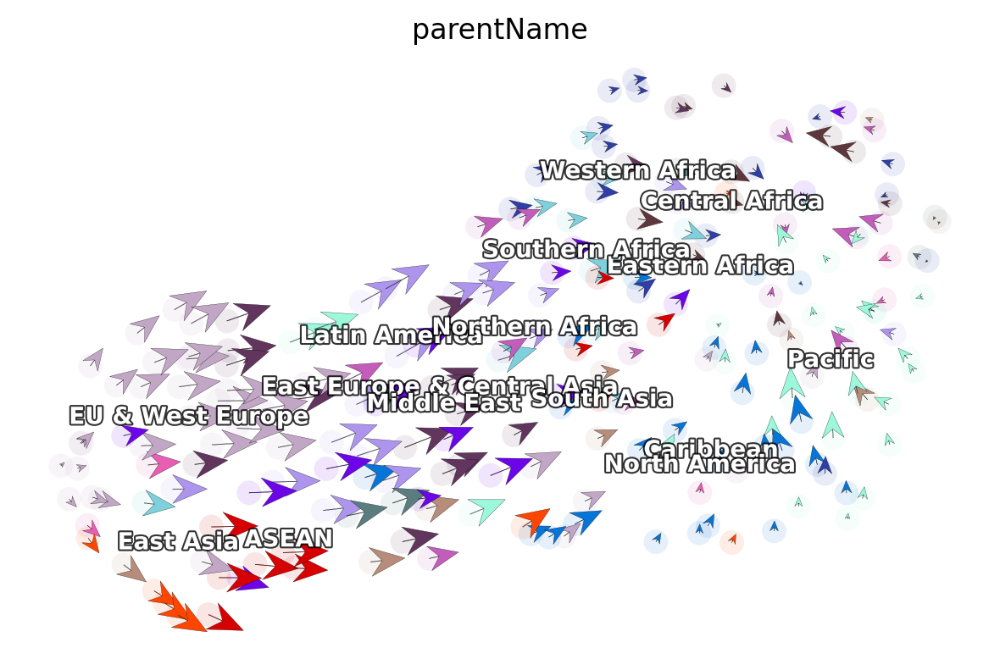

In [23]:
dyn.pl.cell_wise_vectors(adata, color=['parentName'], basis='umap', show_legend='on data', quiver_length=6, quiver_size=6, pointsize=0.1, show_arrowed_spines=False)

In [23]:
adata.uns.keys()

odict_keys(['pp', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap'])

<Figure size 600x400 with 0 Axes>

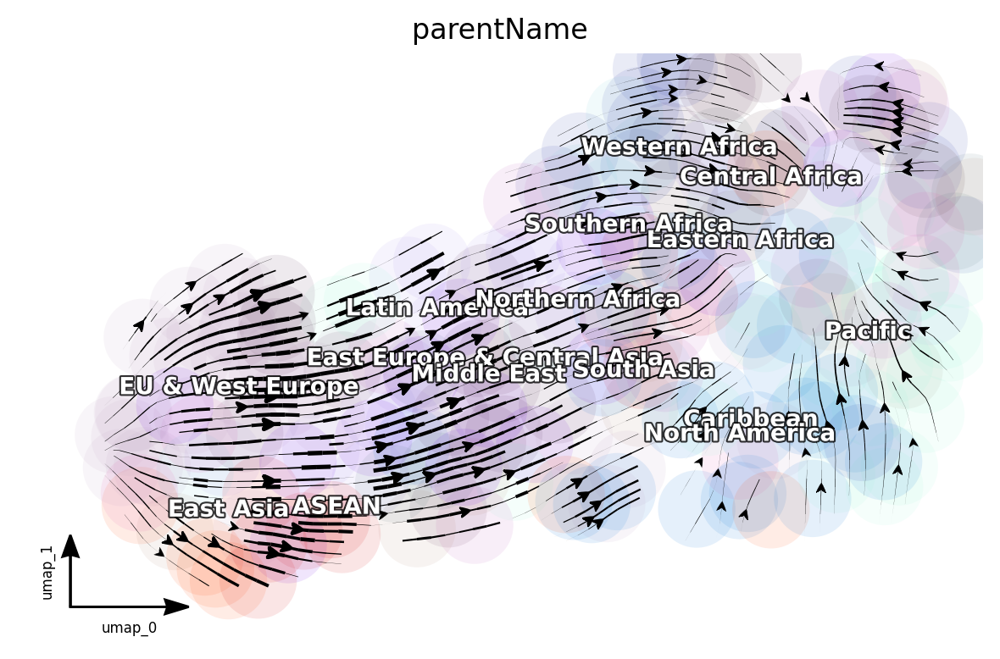

In [24]:
dyn.pl.streamline_plot(adata, color=['parentName'], basis='umap', show_legend='on data', show_arrowed_spines=True)

In [25]:
adata.uns.keys()

odict_keys(['pp', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap'])

<Figure size 1200x800 with 0 Axes>

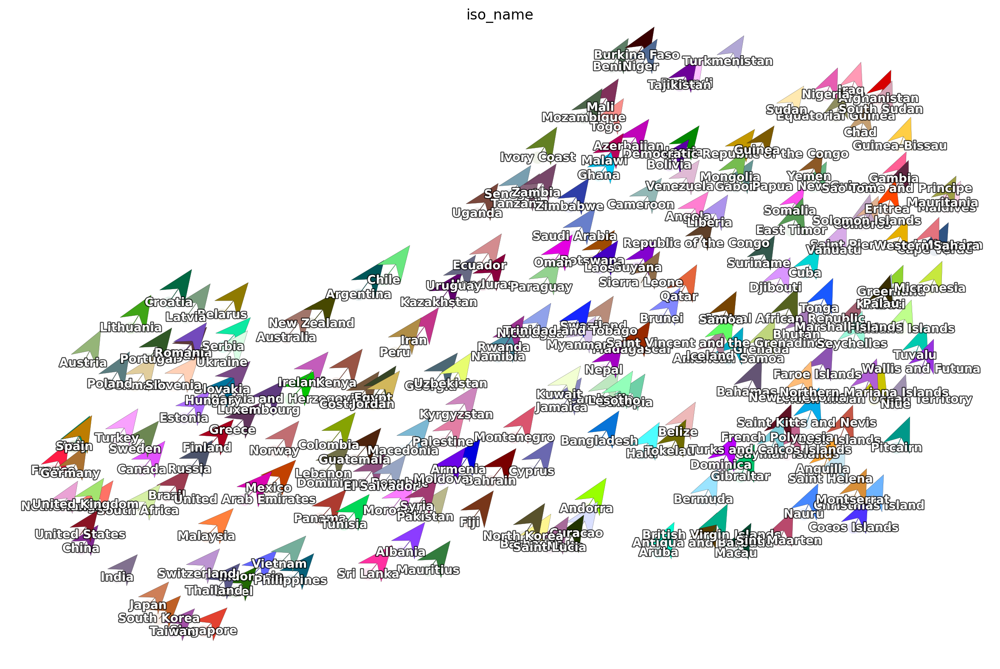

In [26]:
dyn.pl.cell_wise_vectors(adata, color=['iso_name'], basis='umap', show_legend='on data', quiver_length=6, quiver_size=6, pointsize=0.1, show_arrowed_spines=False,figsize=[12.0,8.0])

In [27]:
adata.uns.keys()

odict_keys(['pp', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap'])

<Figure size 1200x800 with 0 Axes>

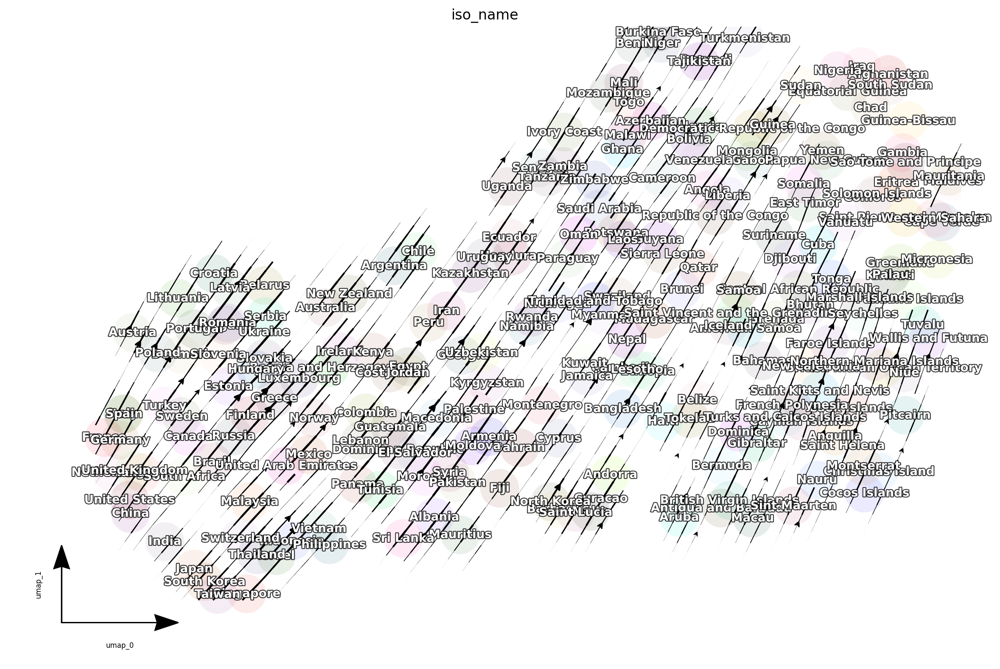

In [28]:
dyn.pl.streamline_plot(adata, color=['iso_name'], basis='umap', show_legend='on data', show_arrowed_spines=True,figsize=[12.0,8.0] )

In [29]:
adata.uns.keys()

odict_keys(['pp', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap'])

In [30]:
adata

AnnData object with n_obs × n_vars = 219 × 1258
    obs: 'id', 'created_at', 'updated_at', 'code', 'iso_code', 'iso_name', 'parentCode', 'parentName', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap'
    obsm: 'X_pca', 'X', 'X_umap', 'velocity_umap'
    layers: 'spliced', 'unspliced', 'X_spliced', 'X_unspliced', 'M_u', 'M_uu', 'M_s', 'M_us', 'M_ss', 'velocity_S'
    obsp: 'moments_con', 'connectivities', 'distances', 'pearson_trans

<Figure size 1200x800 with 0 Axes>

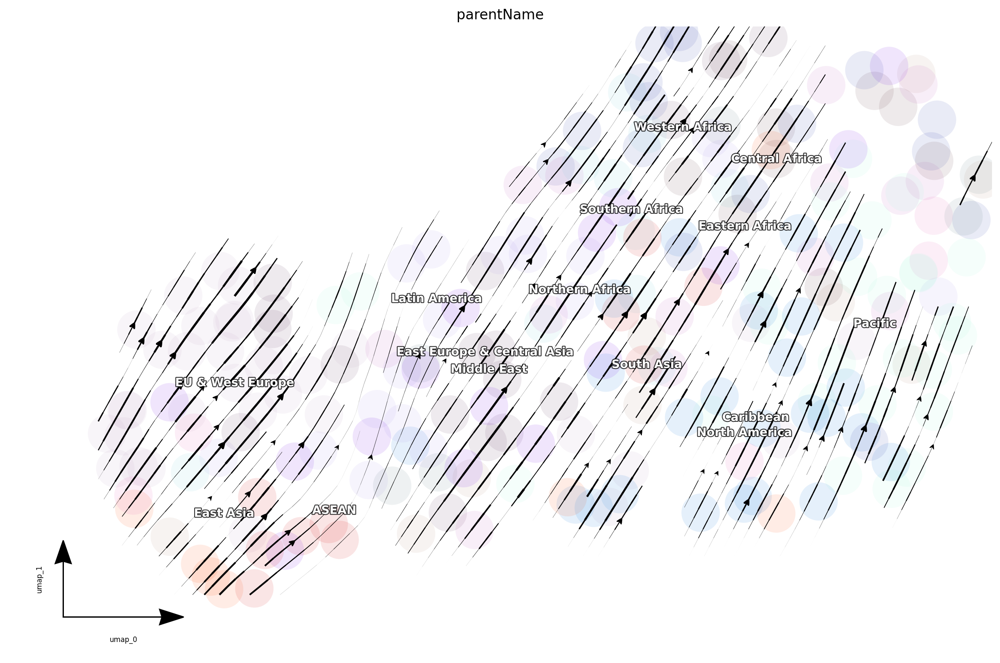

In [31]:
dyn.pl.streamline_plot(adata, color=['parentName'], basis='umap', show_legend='on data', show_arrowed_spines=True,figsize=[12.0,8.0], method="sparsevfc")

In [32]:
adata

AnnData object with n_obs × n_vars = 219 × 1258
    obs: 'id', 'created_at', 'updated_at', 'code', 'iso_code', 'iso_name', 'parentCode', 'parentName', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'control_point_umap', 'inlier_prob_umap', 'obs_vf_angle_umap'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap', 'VecFld_umap', 'VecFld'
    obsm: 'X_pca', 'X', 'X_umap', 'velocity_umap', 'velocity_umap_SparseVFC', 'X_umap_SparseVFC'
    layers: 'spliced', 'unspliced', 'X_spliced', '

In [33]:
adata.layers


Layers with keys: spliced, unspliced, X_spliced, X_unspliced, M_u, M_uu, M_s, M_us, M_ss, velocity_S

In [34]:
adata.layers['X_unspliced']


<219x1258 sparse matrix of type '<class 'numpy.float64'>'
	with 137450 stored elements in Compressed Sparse Row format>

In [35]:
adata.uns['VecFld_umap']['VecFld']['grid_V']

array([[0.46277577, 0.25678236],
       [0.62354762, 0.3252957 ],
       [0.79123552, 0.40320281],
       ...,
       [0.34633707, 0.35500065],
       [0.36340293, 0.34971431],
       [0.35179634, 0.31900148]])

In [36]:
adata.obsm["X_umap"]

array([[120.81049 , 108.345955],
       [113.816124, 104.97107 ],
       [117.9009  , 107.947716],
       [118.615036, 106.4102  ],
       [116.53276 , 105.29519 ],
       [118.025444, 107.46551 ],
       [119.9936  , 105.58779 ],
       [118.23782 , 105.039696],
       [113.19915 , 106.88777 ],
       [114.65951 , 105.5852  ],
       [117.59034 , 104.96945 ],
       [112.14159 , 106.567635],
       [109.16564 , 106.37831 ],
       [117.15166 , 107.99081 ],
       [118.87878 , 106.16251 ],
       [115.12816 , 105.50082 ],
       [116.72263 , 105.797195],
       [115.72503 , 105.032394],
       [111.20031 , 106.73839 ],
       [109.315994, 105.30911 ],
       [117.87303 , 105.86402 ],
       [116.901276, 108.582016],
       [118.24529 , 105.36369 ],
       [119.608505, 106.588585],
       [117.74537 , 107.85184 ],
       [112.20452 , 106.11039 ],
       [116.62094 , 107.13842 ],
       [110.392426, 105.39171 ],
       [120.74183 , 106.108505],
       [118.36661 , 105.098175],
       [11

In [37]:
adata.obsm["velocity_umap"]

array([[0.87130968, 1.02741795],
       [1.69978239, 1.08090532],
       [1.36720087, 0.95392117],
       [1.01818523, 1.13458802],
       [1.40157989, 1.10194124],
       [1.41381457, 0.90968716],
       [0.91500034, 1.20215583],
       [1.00759787, 1.0937092 ],
       [1.78739335, 1.23388335],
       [1.55192945, 1.13147498],
       [1.09931056, 1.09146667],
       [1.88747346, 1.19111255],
       [1.24541606, 1.1840737 ],
       [1.43314113, 0.97863264],
       [1.06823101, 1.20908566],
       [1.81325192, 1.17677867],
       [1.3874758 , 1.09266761],
       [1.39184742, 1.08083195],
       [1.84737545, 1.15967924],
       [1.39362181, 0.94546454],
       [1.23688714, 1.08838921],
       [1.18739936, 1.02700461],
       [1.02734847, 1.10520911],
       [0.94691619, 1.09372172],
       [1.39738103, 0.92339407],
       [1.84459394, 1.0582773 ],
       [1.56464664, 1.10626405],
       [1.66954408, 1.00135901],
       [0.70670055, 1.18316949],
       [1.11983991, 1.12317716],
       [1.

In [38]:
adata.uns["VecFld_" + "umap"]["VecFld"]["grid"]

array([[108.59577942, 104.33849335],
       [108.86813962, 104.33849335],
       [109.14049982, 104.33849335],
       ...,
       [121.39670874, 108.71173096],
       [121.66906894, 108.71173096],
       [121.94142914, 108.71173096]])

In [39]:
adata.uns["VecFld_" + "umap"]["VecFld"]["grid_V"]

array([[0.46277577, 0.25678236],
       [0.62354762, 0.3252957 ],
       [0.79123552, 0.40320281],
       ...,
       [0.34633707, 0.35500065],
       [0.36340293, 0.34971431],
       [0.35179634, 0.31900148]])

In [40]:
len(adata.uns["VecFld_" + "umap"]["VecFld"]["grid"])

2500

In [41]:
len(adata.uns["VecFld_" + "umap"]["VecFld"]["grid_V"])

2500

In [42]:
len(adata.obsm["X_umap"])

219

In [43]:
len(adata.obsm["velocity_umap"])

219

In [44]:
adata.obsm["X_umap"][:,0]

array([120.81049 , 113.816124, 117.9009  , 118.615036, 116.53276 ,
       118.025444, 119.9936  , 118.23782 , 113.19915 , 114.65951 ,
       117.59034 , 112.14159 , 109.16564 , 117.15166 , 118.87878 ,
       115.12816 , 116.72263 , 115.72503 , 111.20031 , 109.315994,
       117.87303 , 116.901276, 118.24529 , 119.608505, 117.74537 ,
       112.20452 , 116.62094 , 110.392426, 120.74183 , 118.36661 ,
       117.632774, 110.59746 , 117.2689  , 118.001495, 121.6337  ,
       116.742615, 117.327576, 110.02591 , 119.4724  , 119.428604,
       120.5407  , 113.56638 , 109.133606, 120.66906 , 120.443665,
       112.75943 , 120.572815, 118.14261 , 118.71641 , 120.230225,
       113.13083 , 110.41919 , 119.73103 , 116.38359 , 115.728485,
       115.82017 , 109.91996 , 119.30176 , 118.501205, 113.255714,
       114.96751 , 113.410126, 113.52439 , 120.18724 , 120.937965,
       110.64248 , 116.635605, 117.10886 , 121.13974 , 119.91467 ,
       114.82397 , 110.97914 , 108.72661 , 119.327034, 118.723

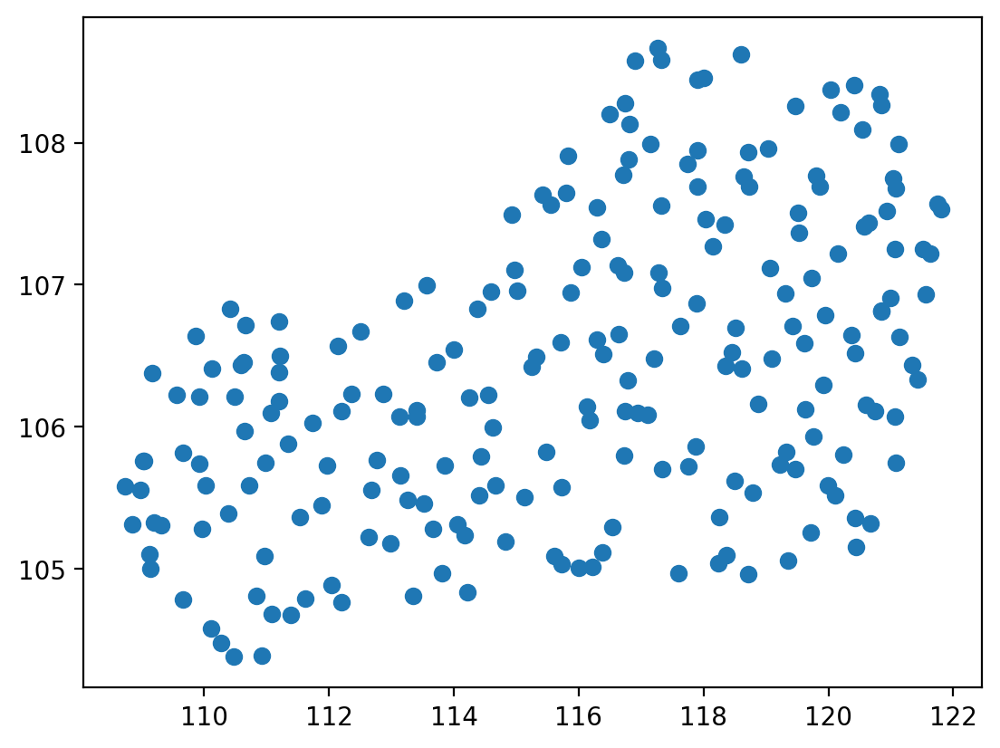

In [45]:
import matplotlib.pyplot as plt

x = adata.obsm["X_umap"][:,0]
y = adata.obsm["X_umap"][:,1]

plt.scatter(x, y)
plt.show()

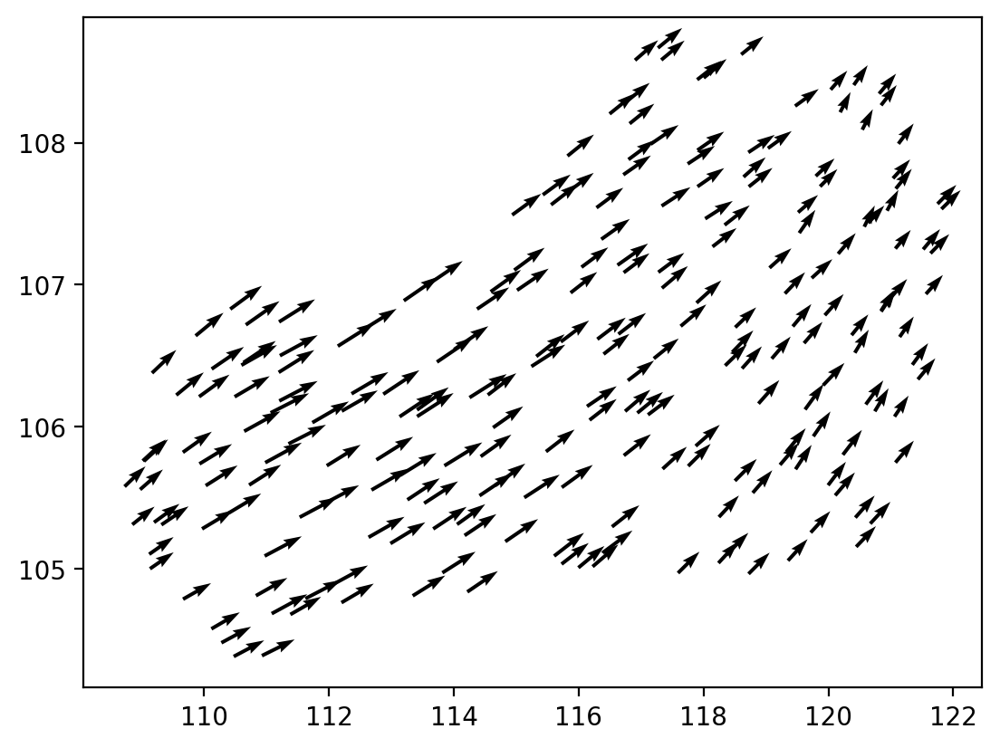

In [46]:
import matplotlib.pyplot as plt

x = adata.obsm["X_umap"][:,0]
y = adata.obsm["X_umap"][:,1]
u = adata.obsm["velocity_umap"][:,0]
v = adata.obsm["velocity_umap"][:,1]
# plt.scatter(x, y)
plt.quiver(x, y, u, v)
plt.show()

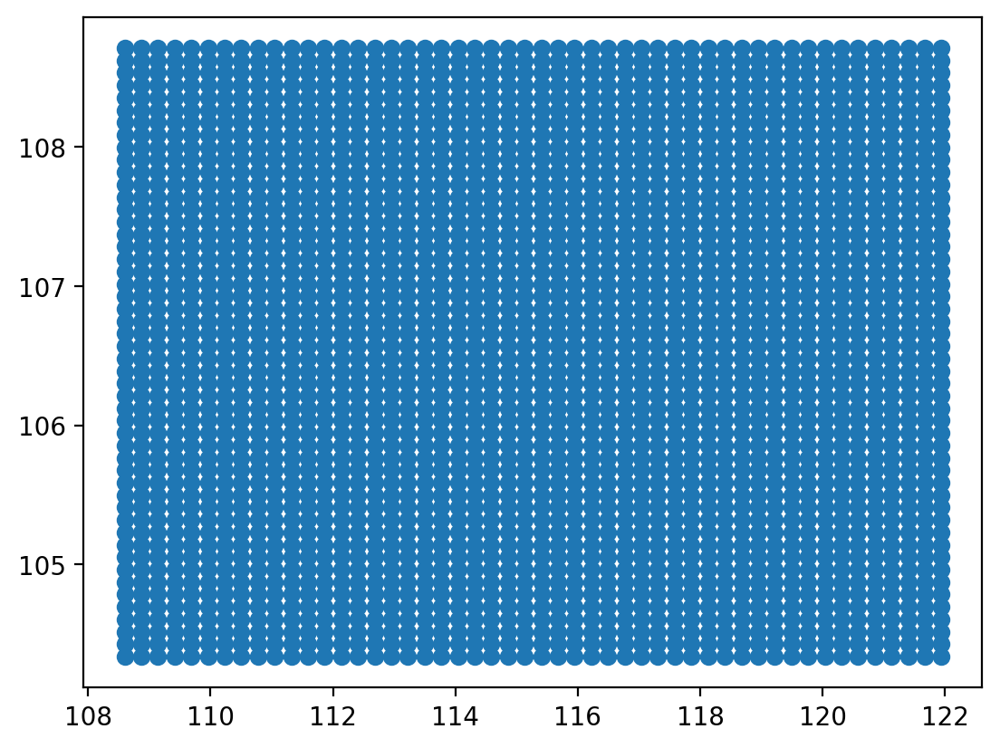

In [47]:
import matplotlib.pyplot as plt

x = adata.uns["VecFld_" + "umap"]["VecFld"]["grid"][:,0]
y = adata.uns["VecFld_" + "umap"]["VecFld"]["grid"][:,1]

plt.scatter(x, y)
plt.show()

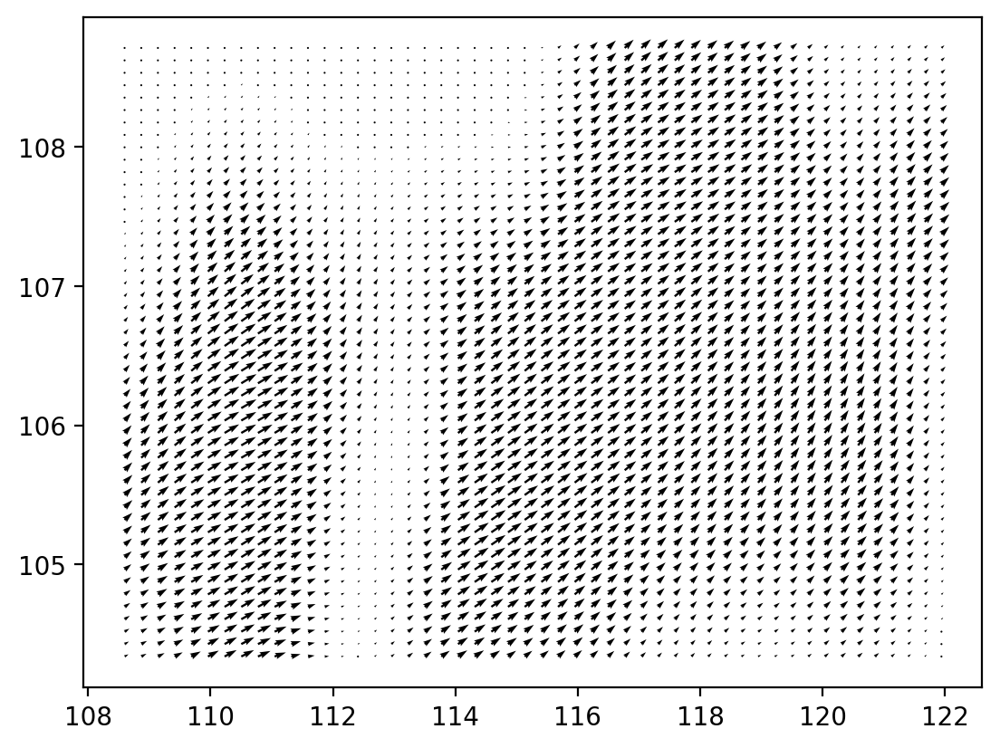

In [48]:
import matplotlib.pyplot as plt

x = adata.uns["VecFld_" + "umap"]["VecFld"]["grid"][:,0]
y = adata.uns["VecFld_" + "umap"]["VecFld"]["grid"][:,1]
u = adata.uns["VecFld_" + "umap"]["VecFld"]["grid_V"][:,0]
v = adata.uns["VecFld_" + "umap"]["VecFld"]["grid_V"][:,1]
# plt.scatter(x, y)
plt.quiver(x, y, u, v)
plt.show()

In [49]:
adata.uns.keys()

odict_keys(['pp', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap', 'VecFld_umap', 'VecFld'])

In [50]:
adata


AnnData object with n_obs × n_vars = 219 × 1258
    obs: 'id', 'created_at', 'updated_at', 'code', 'iso_code', 'iso_name', 'parentCode', 'parentName', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'control_point_umap', 'inlier_prob_umap', 'obs_vf_angle_umap'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap', 'VecFld_umap', 'VecFld'
    obsm: 'X_pca', 'X', 'X_umap', 'velocity_umap', 'velocity_umap_SparseVFC', 'X_umap_SparseVFC'
    layers: 'spliced', 'unspliced', 'X_spliced', '